## Python para finanças

In [1]:
import pandas as pd
import numpy as np
from pandas_datareader import data #utilizada para carregar dados financeiros online
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px #gera gráficos mais dinâmicos

## Base de dados com uma ação

In [2]:
import pandas
from pandas_datareader import data as pdr
import yfinance as yfin


yfin.pdr_override()

gol_df = pdr.get_data_yahoo('GOLL4.SA', start='2015-01-01')

gol_df

[*********************100%***********************]  1 of 1 completed


,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-01-02,14.97,15.20,14.61,14.99,14.99,901900
2015-01-05,14.90,15.01,14.41,14.85,14.85,1272500
2015-01-06,14.75,15.21,14.65,15.21,15.21,2183500
2015-01-07,15.15,15.33,14.55,14.55,14.55,1846900
2015-01-08,14.41,14.65,14.20,14.27,14.27,1569500
...,...,...,...,...,...,...
2023-02-13,6.23,6.36,6.10,6.19,6.19,14172800
2023-02-14,6.21,6.32,5.83,5.86,5.86,17200500
2023-02-15,5.87,6.21,5.77,6.08,6.08,16452300


In [3]:
#no dia 1° de janeiro é feriado, a bolsa não abre nesse dia, por isso começou do dia 02/01
#Adj close é o quanto a ação vale no final do dia, com ajustes. Levando em conta os dividendos ou desdobramentos

In [4]:
gol_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2023 entries, 2015-01-02 to 2023-02-17
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Open       2023 non-null   float64
 1   High       2023 non-null   float64
 2   Low        2023 non-null   float64
 3   Close      2023 non-null   float64
 4   Adj Close  2023 non-null   float64
 5   Volume     2023 non-null   int64  
dtypes: float64(5), int64(1)
memory usage: 110.6 KB


In [5]:
gol_df.head(3)

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2015-01-02,14.97,15.20,14.61,14.99,14.99,901900
2015-01-05,14.90,15.01,14.41,14.85,14.85,1272500
2015-01-06,14.75,15.21,14.65,15.21,15.21,2183500


In [6]:
gol_df.tail(3)

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2023-02-15,5.87,6.21,5.77,6.08,6.08,16452300
2023-02-16,6.06,6.12,5.86,5.97,5.97,12406300
2023-02-17,5.95,6.05,5.86,5.93,5.93,10590800


In [7]:
gol_df.describe()

,Open,High,Low,Close,Adj Close,Volume
count,2023.000000,2023.000000,2023.000000,2023.000000,2023.000000,2.023000e+03
mean,15.212081,15.586718,14.815428,15.172803,15.172803,5.727874e+06
std,9.316044,9.486994,9.137093,9.309175,9.309175,5.067419e+06
min,1.160000,1.180000,1.130000,1.160000,1.160000,0.000000e+00
25%,7.840000,8.040000,7.640000,7.825000,7.825000,2.185500e+06
50%,13.800000,14.160000,13.420000,13.740000,13.740000,4.236500e+06
75%,21.000000,21.460000,20.460000,20.889999,20.889999,7.644650e+06
max,43.669998,44.619999,41.310001,43.790001,43.790001,4.368050e+07


## Pegando o registro de quando a ação da GOL atingiu seu maior valor de fechamento

In [8]:
gol_df[gol_df['Close'] >= 43.79] #dia em que a ação teve o maior valor de fechamento

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2019-08-01,41.25,44.619999,41.25,43.790001,43.790001,6664200


## Pegando o registro de quando a ação da GOL atingiu seu menor valor de fechamento

In [9]:
gol_df[(gol_df['Close'] >= 1.15) & (gol_df['Close'] <= 1.16) ]

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2016-01-22,1.2,1.26,1.14,1.16,1.16,3830600


In [10]:
gol_df.to_csv('gol.csv') #salvando o arquivo caso haja alguma falha na comunicação com a API

In [11]:
gol_df2 = pd.read_csv('gol.csv')
gol_df2.head()

,Date,Open,High,Low,Close,Adj Close,Volume
0,2015-01-02,14.97,15.20,14.61,14.99,14.99,901900
1,2015-01-05,14.90,15.01,14.41,14.85,14.85,1272500
2,2015-01-06,14.75,15.21,14.65,15.21,15.21,2183500
3,2015-01-07,15.15,15.33,14.55,14.55,14.55,1846900
4,2015-01-08,14.41,14.65,14.20,14.27,14.27,1569500


## Criação de base de dados com mais ações

In [12]:
#O valor .SA é uma particularidade do yahoo financas
#O BOVA11 serve para dizer se uma ação está tendo um bom desempenho, pois compararemos a ação com este índice
acoes = ['GOLL4.SA', 'CVCB3.SA', 'WEGE3.SA', 'MGLU3.SA', 'AMER3.SA', 'TOTS3.SA', 'BOVA11.SA']

In [13]:
import pandas
from pandas_datareader import data as pdr
import yfinance as yfin

yfin.pdr_override()

acoes_df = pd.DataFrame()
for acao in acoes:
    acoes_df[acao] = pdr.get_data_yahoo(acao, start='2015-01-01')['Close'] #Pegando apenas a coluna close

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [14]:
acoes_df

,GOLL4.SA,CVCB3.SA,WEGE3.SA,MGLU3.SA,AMER3.SA,TOTS3.SA,BOVA11.SA
Date,,,,,,,
2015-01-02,14.99,15.20,5.923076,0.232812,21.140331,11.910702,47.259998
2015-01-05,14.85,15.00,5.963461,0.237187,20.464613,11.544731,46.320000
2015-01-06,15.21,14.80,5.875000,0.234062,20.522532,10.822770,46.580002
2015-01-07,14.55,14.67,5.807692,0.241875,20.319817,10.746248,48.150002
2015-01-08,14.27,14.15,5.905769,0.240000,19.653751,10.995774,48.509998
...,...,...,...,...,...,...,...
2023-02-13,6.19,3.72,38.580002,4.130000,1.130000,29.910000,105.470001
2023-02-14,5.86,3.47,38.360001,4.060000,1.110000,29.840000,104.430000
2023-02-15,6.08,3.46,38.880001,3.890000,1.130000,28.600000,106.050003


## Renomeando as colunas do DF

In [15]:
acoes_df = acoes_df.rename(columns={'GOLL4.SA': 'GOL', 'CVCB3.SA': 'CVC', 'WEGE3.SA':'WEGE',
                                   'MGLU3.SA':'MGLU', 'AMER3.SA':'AMER', 'TOTS3.SA': 'TOTS', 'BOVA11.SA':'BOVA'})

In [16]:
acoes_df.head()

,GOL,CVC,WEGE,MGLU,AMER,TOTS,BOVA
Date,,,,,,,
2015-01-02,14.99,15.20,5.923076,0.232812,21.140331,11.910702,47.259998
2015-01-05,14.85,15.00,5.963461,0.237187,20.464613,11.544731,46.320000
2015-01-06,15.21,14.80,5.875000,0.234062,20.522532,10.822770,46.580002
2015-01-07,14.55,14.67,5.807692,0.241875,20.319817,10.746248,48.150002
2015-01-08,14.27,14.15,5.905769,0.240000,19.653751,10.995774,48.509998


In [17]:
acoes_df.isnull().sum() #isnull() retorna True quando há um valor nulo

GOL     0
CVC     0
WEGE    0
MGLU    0
AMER    0
TOTS    0
BOVA    0
dtype: int64

In [18]:
acoes_df.shape

(2023, 7)

In [19]:
acoes_df.dropna(inplace=True) #apaga registros nulos

In [20]:
acoes_df.shape

(2023, 7)

In [21]:
acoes_df.to_csv('acoes.csv')

In [22]:
acoes_df = pd.read_csv('acoes.csv')
acoes_df.head()

,Date,GOL,CVC,WEGE,MGLU,AMER,TOTS,BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,21.140331,11.910702,47.259998
1,2015-01-05,14.85,15.00,5.963461,0.237187,20.464613,11.544731,46.320000
2,2015-01-06,15.21,14.80,5.875000,0.234062,20.522532,10.822770,46.580002
3,2015-01-07,14.55,14.67,5.807692,0.241875,20.319817,10.746248,48.150002
4,2015-01-08,14.27,14.15,5.905769,0.240000,19.653751,10.995774,48.509998


In [23]:
acoes_df.columns

Index(['Date', 'GOL', 'CVC', 'WEGE', 'MGLU', 'AMER', 'TOTS', 'BOVA'], dtype='object')

In [24]:
acoes_df.columns[1:] #mostrando apenas os nomes das ações, sem a data

Index(['GOL', 'CVC', 'WEGE', 'MGLU', 'AMER', 'TOTS', 'BOVA'], dtype='object')

In [25]:
acoes_df.describe()

,GOL,CVC,WEGE,MGLU,AMER,TOTS,BOVA
count,2023.000000,2023.000000,2023.000000,2023.000000,2023.000000,2023.000000,2023.000000
mean,15.172803,27.630408,17.311291,6.704301,34.192342,18.081507,82.267322
std,9.309175,16.396177,12.669996,7.579056,26.061190,9.423579,23.967462
min,1.160000,3.460000,4.942307,0.030585,0.710000,7.156402,36.450001
25%,7.825000,14.735000,6.775000,0.415956,14.841179,10.084173,60.434999
50%,13.740000,21.622334,9.410000,3.910000,25.069151,12.609375,83.239998
75%,20.889999,42.535000,30.925000,9.737500,45.467033,27.510000,103.680000
max,43.790001,64.800003,46.105000,27.450001,126.000000,40.599998,125.750000


 ## Visualização

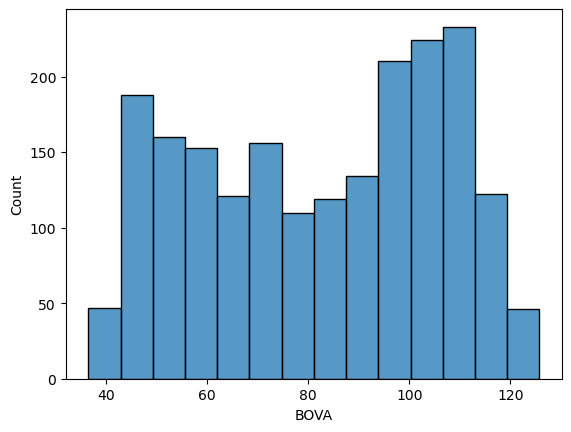

In [26]:
sns.histplot(acoes_df['BOVA']);
#sns.histplot(acoes_df['GOL'], bins=10);
#O histograma faz a divisão em faixas, exemplo: de R$1 até R$5, de R$5 até R$10
#bins representa o número de divisões

In [27]:
len(acoes_df.columns[1:])

7

In [28]:
acoes_df.columns[1:]

Index(['GOL', 'CVC', 'WEGE', 'MGLU', 'AMER', 'TOTS', 'BOVA'], dtype='object')

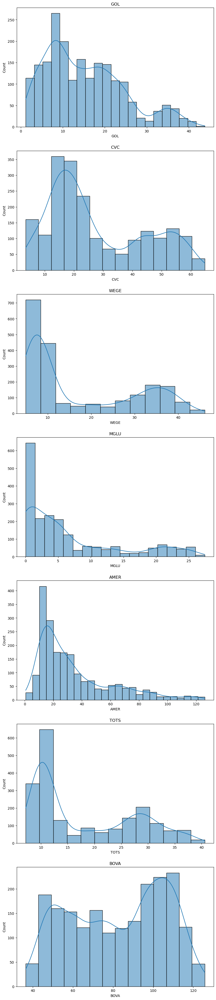

In [29]:
plt.figure(figsize=(10, 50))

for i, acao in enumerate(acoes_df.columns[1:]):
    plt.subplot(7, 1, i + 1) #7 linhas e 1 coluna
    sns.histplot(acoes_df[acoes_df.columns[i + 1]], kde=True) #kde indica o tipo de distribuição
    plt.title(acoes_df.columns[i + 1])

In [30]:
acoes_df['GOL'].describe()

count    2023.000000
mean       15.172803
std         9.309175
min         1.160000
25%         7.825000
50%        13.740000
75%        20.889999
max        43.790001
Name: GOL, dtype: float64

<AxesSubplot:xlabel='GOL'>

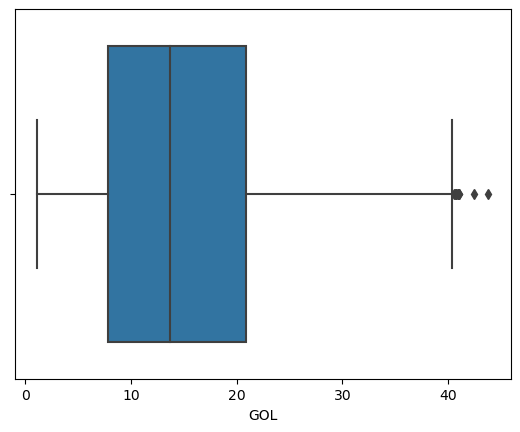

In [31]:
sns.boxplot(x=acoes_df['GOL'])
#A primeira barra representa o valor mínimo da ação
#A última barra representa o valor máximo da ação
#Os pontos são os outliers
#As 3 linhas verticais que estão dentro da caixa são: 1°, 2° (mediana) e 3° quartis
#O box plot é muito bom para identificar ações que tiveram uma valorização ou desvalorização repentina

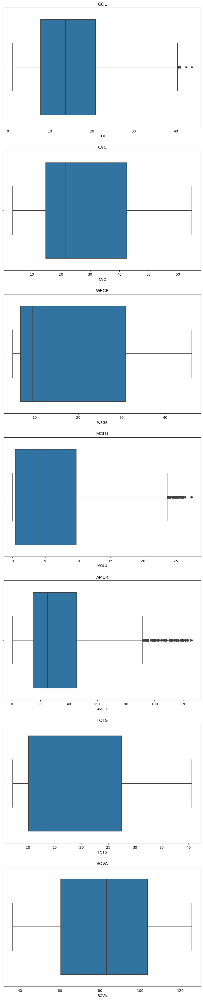

In [32]:
plt.figure(figsize=(10, 50))

for i, acao in enumerate(acoes_df.columns[1:]):
    plt.subplot(7, 1, i + 1) #7 linhas e 1 coluna
    sns.boxplot(x = acoes_df[acoes_df.columns[i + 1]]) #kde indica o tipo de distribuição
    plt.title(acoes_df.columns[i + 1])

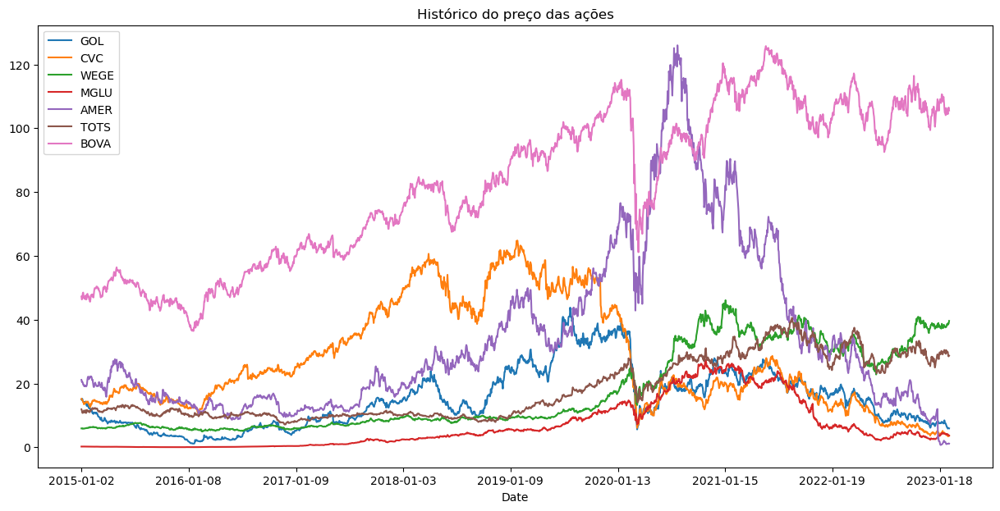

In [33]:
acoes_df.plot(x='Date', figsize=(15,7), title='Histórico do preço das ações');

## Normalização da base de dados

### A data 2015-01-02 será usada de referência para a normalização

In [34]:
acoes_df

,Date,GOL,CVC,WEGE,MGLU,AMER,TOTS,BOVA
0,2015-01-02,14.99,15.20,5.923076,0.232812,21.140331,11.910702,47.259998
1,2015-01-05,14.85,15.00,5.963461,0.237187,20.464613,11.544731,46.320000
2,2015-01-06,15.21,14.80,5.875000,0.234062,20.522532,10.822770,46.580002
3,2015-01-07,14.55,14.67,5.807692,0.241875,20.319817,10.746248,48.150002
4,2015-01-08,14.27,14.15,5.905769,0.240000,19.653751,10.995774,48.509998
...,...,...,...,...,...,...,...,...
2018,2023-02-13,6.19,3.72,38.580002,4.130000,1.130000,29.910000,105.470001
2019,2023-02-14,5.86,3.47,38.360001,4.060000,1.110000,29.840000,104.430000
2020,2023-02-15,6.08,3.46,38.880001,3.890000,1.130000,28.600000,106.050003
2021,2023-02-16,5.97,3.71,38.779999,3.810000,1.220000,28.500000,106.500000


In [35]:
acoes_df_normalizado = acoes_df.copy()
for i in acoes_df_normalizado.columns[1:]:
    acoes_df_normalizado[i] = acoes_df_normalizado[i] / acoes_df_normalizado[i][0]

In [36]:
acoes_df_normalizado

,Date,GOL,CVC,WEGE,MGLU,AMER,TOTS,BOVA
0,2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2015-01-05,0.990660,0.986842,1.006818,1.018792,0.968037,0.969274,0.980110
2,2015-01-06,1.014676,0.973684,0.991883,1.005369,0.970776,0.908659,0.985612
3,2015-01-07,0.970647,0.965132,0.980520,1.038928,0.961187,0.902235,1.018832
4,2015-01-08,0.951968,0.930921,0.997078,1.030875,0.929680,0.923184,1.026449
...,...,...,...,...,...,...,...,...
2018,2023-02-13,0.412942,0.244737,6.513508,17.739636,0.053452,2.511187,2.231697
2019,2023-02-14,0.390927,0.228289,6.476365,17.438963,0.052506,2.505310,2.209691
2020,2023-02-15,0.405604,0.227632,6.564157,16.708761,0.053452,2.401202,2.243970
2021,2023-02-16,0.398266,0.244079,6.547273,16.365135,0.057710,2.392806,2.253491


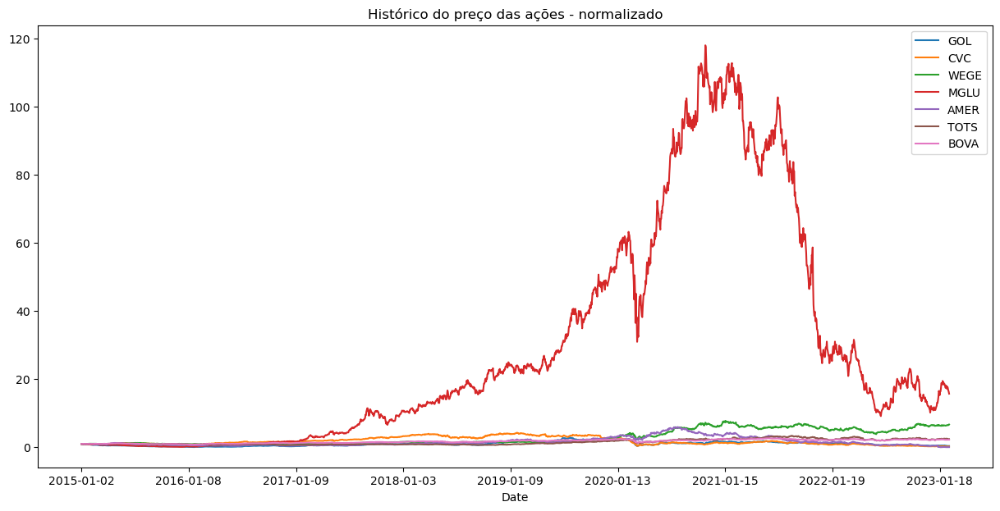

In [37]:
acoes_df_normalizado.plot(x='Date', figsize=(15,7), title='Histórico do preço das ações - normalizado');

## Geração de um gráfico dinâmico

In [38]:
figura = px.line(title='Histórico do preço das ações')
for i in acoes_df.columns[1:]:
    figura.add_scatter(x=acoes_df['Date'], y=acoes_df[i], name=i)

figura.show()

In [39]:
figura = px.line(title='Histórico do preço das ações')
for i in acoes_df_normalizado.columns[1:]:
    figura.add_scatter(x=acoes_df_normalizado['Date'], y=acoes_df_normalizado[i], name=i)

figura.show()

## Exercício com outras empresas

In [40]:
import pandas
from pandas_datareader import data as pdr
import yfinance as yfin

yfin.pdr_override()

acoes = ['ABEV3.SA', 'ODPV3.SA', 'VIVT3.SA', 'PETR3.SA', 'BBAS3.SA', 'SMTO3.SA', 'BOVA11.SA']

acoes_df = pd.DataFrame()
for acao in acoes:
    acoes_df[acao] = pdr.get_data_yahoo(acao, start='2015-01-01')['Close'] #Pegando apenas a coluna close

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [41]:
acoes_df = acoes_df.rename(columns={'ABEV3.SA': 'AMBEV', 'ODPV3.SA': 'ODOPRV', 'VIVT3.SA':'VIVO',
                                   'PETR3.SA':'PETBR', 'BBAS3.SA':'BB', 'SMTO3.SA': 'SM', 'BOVA11.SA':'BOVA'})

In [42]:
acoes_df

,AMBEV,ODOPRV,VIVO,PETBR,BB,SM,BOVA
Date,,,,,,,
2015-01-02,16.020000,9.37,37.820000,9.000000,22.650000,12.226666,47.259998
2015-01-05,15.730000,9.62,37.070000,8.270000,22.180000,11.620000,46.320000
2015-01-06,16.330000,9.55,36.150002,8.060000,22.490000,11.026666,46.580002
2015-01-07,16.559999,9.69,37.389999,8.450000,23.480000,11.066666,48.150002
2015-01-08,16.540001,9.66,38.910000,9.020000,23.559999,11.166666,48.509998
...,...,...,...,...,...,...,...
2023-02-13,13.130000,12.08,39.279999,30.230000,40.599998,27.940001,105.470001
2023-02-14,13.000000,11.96,39.529999,30.049999,41.549999,26.610001,104.430000
2023-02-15,13.230000,12.47,39.669998,30.180000,41.930000,27.170000,106.050003


In [43]:
acoes_df.isnull().sum()

AMBEV     0
ODOPRV    0
VIVO      0
PETBR     0
BB        0
SM        0
BOVA      0
dtype: int64

In [44]:
acoes_df.describe()

,AMBEV,ODOPRV,VIVO,PETBR,BB,SM,BOVA
count,2023.000000,2023.000000,2023.000000,2023.000000,2023.000000,2023.000000,2023.000000
mean,17.369234,12.911656,41.872946,22.165724,32.710954,22.217027,82.267322
std,2.496632,2.340368,5.312614,8.399605,9.558135,8.360198,23.967462
min,11.030000,8.130000,28.980000,5.910000,12.700000,9.633333,36.450001
25%,15.440000,11.150000,37.754999,14.675000,27.105000,17.280001,60.434999
50%,17.780001,12.900000,41.849998,22.799999,32.279999,19.040001,83.239998
75%,19.025001,14.670000,45.259998,29.440001,37.795000,26.290000,103.680000
max,24.270000,18.430000,56.740002,41.560001,55.180000,52.299999,125.750000


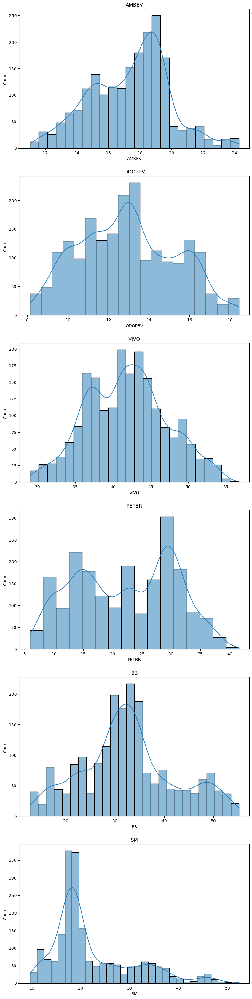

In [45]:
plt.figure(figsize=(10, 50))

for i, acao in enumerate(acoes_df.columns[1:]):
    plt.subplot(7, 1, i + 1) #7 linhas e 1 coluna
    sns.histplot(acoes_df[acoes_df.columns[i]], kde=True) #kde indica o tipo de distribuição
    plt.title(acoes_df.columns[i])

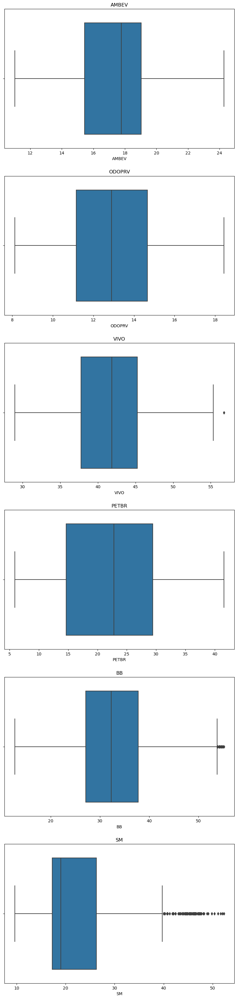

In [46]:
plt.figure(figsize=(10, 50))

for i, acao in enumerate(acoes_df.columns[1:]):
    plt.subplot(7, 1, i + 1) #7 linhas e 1 coluna
    sns.boxplot(x = acoes_df[acoes_df.columns[i]]) #kde indica o tipo de distribuição
    plt.title(acoes_df.columns[i])

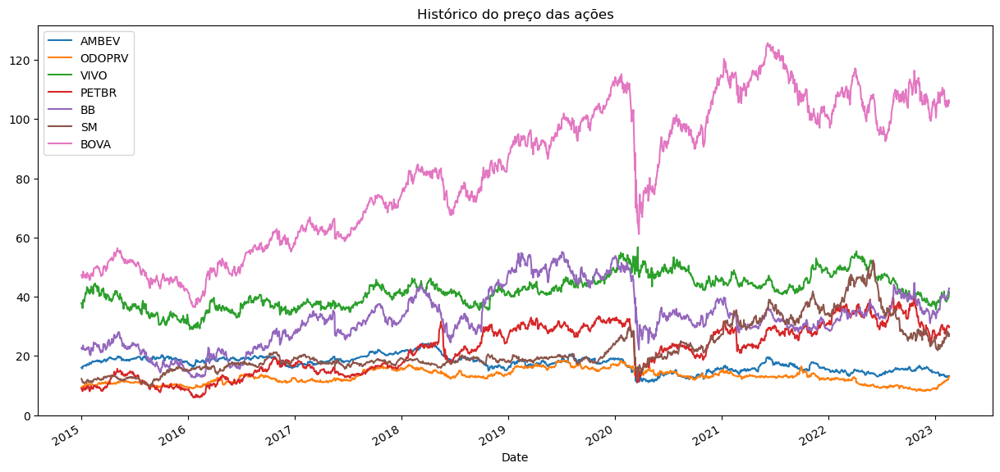

In [47]:
acoes_df.plot(figsize=(15,7), title='Histórico do preço das ações');

In [48]:
acoes_df_normalizado = acoes_df.copy()
for i in acoes_df_normalizado.columns:
    acoes_df_normalizado[i] = acoes_df_normalizado[i] / acoes_df_normalizado[i][0]

In [49]:
acoes_df_normalizado

,AMBEV,ODOPRV,VIVO,PETBR,BB,SM,BOVA
Date,,,,,,,
2015-01-02,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-01-05,0.981898,1.026681,0.980169,0.918889,0.979249,0.950382,0.980110
2015-01-06,1.019351,1.019210,0.955844,0.895556,0.992936,0.901854,0.985612
2015-01-07,1.033708,1.034152,0.988630,0.938889,1.036645,0.905125,1.018832
2015-01-08,1.032459,1.030950,1.028821,1.002222,1.040177,0.913304,1.026449
...,...,...,...,...,...,...,...
2023-02-13,0.819600,1.289221,1.038604,3.358889,1.792494,2.285169,2.231697
2023-02-14,0.811486,1.276414,1.045214,3.338889,1.834437,2.176390,2.209691
2023-02-15,0.825843,1.330843,1.048916,3.353333,1.851214,2.222192,2.243970


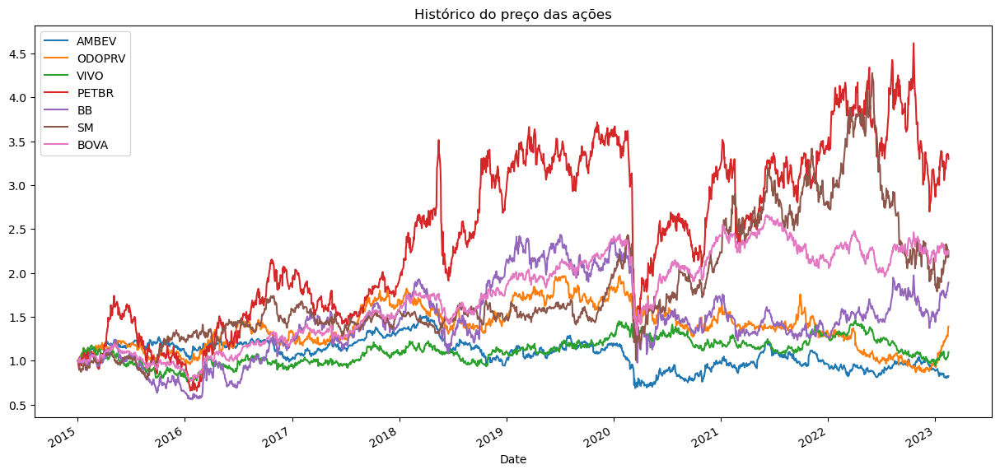

In [50]:
acoes_df_normalizado.plot(figsize=(15,7), title='Histórico do preço das ações normalizado');

In [51]:
acoes_df.index

DatetimeIndex(['2015-01-02', '2015-01-05', '2015-01-06', '2015-01-07',
               '2015-01-08', '2015-01-09', '2015-01-12', '2015-01-13',
               '2015-01-14', '2015-01-15',
               ...
               '2023-02-06', '2023-02-07', '2023-02-08', '2023-02-09',
               '2023-02-10', '2023-02-13', '2023-02-14', '2023-02-15',
               '2023-02-16', '2023-02-17'],
              dtype='datetime64[ns]', name='Date', length=2023, freq=None)

In [52]:
figura = px.line(title='Histórico do preço das ações')
for i in acoes_df.columns:
    figura.add_scatter(x=acoes_df.index, y=acoes_df[i], name=i)

figura.show()

In [53]:
figura = px.line(title='Histórico do preço das ações normalizado')
for i in acoes_df_normalizado.columns:
    figura.add_scatter(x=acoes_df_normalizado.index, y=acoes_df_normalizado[i], name=i)

figura.show()